Two years ago, I've had the pleasure to take a Harvard class entitled [Science & Cooking: From Haute Cuisine to Soft Matter Science (part 1)](https://www.edx.org/course/science-cooking-from-haute-cuisine-to-soft-matter) on edx, a MOOC platform.

This has lead me to do some fun kitchen science, in particular trying to [cook an egg using math formulas](https://flothesof.github.io/cooking-egg-math.html) (spoiler: it was not successful).

One of the tools introduced by the class is the [Cook my Meat App](http://up.csail.mit.edu/science-of-cooking/). The app allows you to specify a cooking protocol for meat modelled as a 1D medium. Ever since seing this app, I thought it would be nice to replicate it with my own tools and learn from it. This post is the attempt to do just this. 

I'll try to go from the theory, that is the heat equation in 1D, to the implementation using the Crank-Nicholson time stepping method. In the end, we'll try to compare our results with these from the app (and they'll hopefully be the same).

# The 1D heat equation and the Crank-Nicholson method  

The problem tackled by the Cook my Meat app is that of cooking a steak. The steak has thickness $L$ and is heated on one side by a heat source, while being in contact with the outside air on the other side. It also starts at a given initial temperature.

Our problem consists of solving for the temperature distribution as a function of time. The temperature evolution is governed by the 1D heat equation, written as 

$$
\frac{\partial T}{\partial t} = D \frac{\partial^2 T}{\partial x^2} 
$$

The physical interpretation of this equation is that heat flows through space along the $x$ coordinate at a rate that is proportional to the diffusion constant $D$ and to the local second derivative with respect to space of temperature. 

The two boundary conditions (heated on one side, contact with outside air) are written as

$$
\left\{
\begin{aligned}
T(0, t) = T_{hot} \\
T(L, t) = T_{cold} 
\end{aligned}
\right .
$$

The Crank-Nicholson method consists, when discretizing the continuous temperature field to a grid (with notation $T_i^n$), to use the following equations

$$
\frac{T_i^{n+1} - T_i^{n}}{\Delta t} = \dfrac{1}{2} \left [ D \frac{T_{i+1}^{n} - 2 T_{i}^{n} + T_{i-1}^{n}}{\Delta x^2} + D \frac{T_{i+1}^{n+1} - 2 T_{i}^{n+1} + T_{i-1}^{n+1}}{\Delta x^2}\right ] \, \forall i \in [1, N-1]
$$

The boundary conditions become:

$$
\left\{
\begin{aligned}
T_j^{n} = && T_{hot} && j=0\\
T_j^{n} = && T_{cold} && j = N 
\end{aligned}
\right .
$$

Denoting by $\underline{T}^n$ the vector of unknown temperatures at timestep $n$, the above becomes


$$
\mathbb{1} (\underline{T}^{n+1} - \underline{T}^{n})  = \frac{\Delta t}{2} \mathbb{M} (\underline{T}^{n+1} + \underline{T}^{n}) 
$$

$$
(\mathbb{1} - \frac{\Delta t}{2} \mathbb{M}) \underline{T}^{n+1} = (\mathbb{1} + \frac{\Delta t}{2} \mathbb{M})  \underline{T}^{n}
$$

Finally, the whole system becomes 

$$
A \underline{T}^{n+1} = B \underline{T}^{n}
$$

Assuming the matrix $B$ is invertible, the solution at timestep $n+1$ is obtained by 

$$
 \underline{T}^{n+1} =  A^{-1} B \underline{T}^n
$$

Since material parameters are constant, we can compute $B^{-1} A$ only once and then apply it repeatedly, which should be computationally efficient.

# Implementation using Python 

Units used for the implementation: millimeters, seconds, °C.

In this unit, the heat diffusion constant of water (to which steak is assimilated) is $D = 0.14$ (in mm^2/sec).

In [1]:
import numpy as np

def assemble_m_matrix(N, D, dx):
    M = np.zeros((N+1, N+1))
    for i in range(N+1):
        if i <= 0 or i >= N:
            continue
        else:
            M[i, i-1] =      D / dx**2
            M[i,   i] = -2 * D / dx**2
            M[i, i+1] =      D / dx**2
    return M

class CrankNicholsonSolver:
    def __init__(self, x, T_initial, T_hot, T_cold, dt, D):
        self.t = 0
        self.dt = dt
        self.x = np.asarray(x).copy()
        self.T = np.asarray(T_initial).copy()
        self.T_hot = T_hot
        self.T_cold = T_cold
        N = self.x.size - 1
        dx = x[1] - x[0]
        M = assemble_m_matrix(N, D, dx)
        B = (np.eye(N+1) + dt/2 * M)
        A = (np.eye(N+1) - dt/2 * M)
        self.inv_matrix = np.dot(np.linalg.inv(A), B)
        
    def apply_BC(self):
        self.T[0] = self.T_hot
        self.T[-1] = self.T_cold 
        
    def step(self):
        self.apply_BC()
        self.T = np.dot(self.inv_matrix, self.T)
        self.t += self.dt
        
    def n_steps(self, n):
        for i in range(n):
            self.step()
            
KELVIN  = 273.15            
x = np.linspace(0, 30, num=200) # 30 mm steak
T_initial = np.ones_like(x) * (23 + KELVIN) # °C
T_hot = 150 + KELVIN
T_cold = 23 + KELVIN
dt = 0.01
D = 0.14
solver = CrankNicholsonSolver(x, T_initial, T_hot, T_cold, dt, D)

With the solver in place, we can use it to simulate some cooking.

First, we're going to make some functions that allow us to visualize the heat diffusion process.

Then, we'll adapt our solver to inputs from the Cook my Meat App.

# Visualizing the heat flow 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
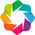

In [2]:
import holoviews as hv
hv.extension('bokeh')
hv.opts.defaults(hv.opts.QuadMesh(colorbar=True, width=700, tools=['hover'], cmap='viridis'))

In [3]:
solver_params = dict(x=np.linspace(0, 30, num=200), 
                     T_initial=np.ones_like(np.linspace(0, 30, num=200)) * (23 + KELVIN), 
                     T_hot=150 + KELVIN, 
                     T_cold=23 + KELVIN, 
                     dt=0.01, 
                     D=0.14)

def make_snapshots(solver_params, tmax, n_snapshots, M=20):
    time_grid = np.linspace(0, tmax, num=n_snapshots)
    dt = time_grid[1] - time_grid[0]
    params = solver_params.copy()
    params['dt'] = dt / M
    solver = CrankNicholsonSolver(**params)
    snapshots = []
    for _ in range(time_grid.size):
        solver.n_steps(M)
        snapshots.append(solver.T.copy())
    return time_grid, snapshots

In [4]:
tmax = 4 * 60
n_snapshots = 64
time_grid, snapshots = make_snapshots(solver_params, tmax, n_snapshots)

hv.QuadMesh((time_grid, solver_params['x'], np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature')

:QuadMesh   [time,x]   (temperature)

In [5]:
hv.Curve(snapshots[-1] - KELVIN).opts(tools=['hover'])

:Curve   [x]   (y)

# Using cook my meat app inputs

Now that the basic machinery is in place, we can turn to replicating the data from the Cook My Meat app. It relies on a simple text format to describe cooking procedures.

The basic recipe proposed by the app is as follows:

```
3cm Steak starts at 23°C
150°C and 23°C for 4:00
23°C and 150°C for 4:00
23°C and 23°C for 5:00
```
It consists of a header and an initial temperature followed by boundary temperatures and the duration of cooking with these in place. We can build a simple parser using regular expressions that extracts the information from such an input. 

In [6]:
import re

four_minutes_a_side = """3cm Steak starts at 23°C
150°C and 23°C for 4:00
23°C and 150°C for 4:00
23°C and 23°C for 5:00"""

def parse_input(recipe):
    header, *lines =  recipe.split('\n')
    thickness_cm, T_initial = list(map(float, re.findall("([\d.]+)cm Steak starts at ([-\d.]+)°[C]", header)[0]))
    T_initial += KELVIN
    steps = []
    for line in lines:
        Tleft, Tright, mins, secs = re.findall("([-\d.]+)°[C] and ([-\d.]+)°[C] for ([\d]+):(\d{2})", line)[0]
        steps.append((float(Tleft) + KELVIN, float(Tright) + KELVIN, 60 * int(mins) + int(secs)))
    parsed_params = dict(thickness_mm=thickness_cm * 10, initial_temperature_C=T_initial, steps=steps)
    return parsed_params

parse_input(four_minutes_a_side)

{'thickness_mm': 30.0,
 'initial_temperature_C': 296.15,
 'steps': [(423.15, 296.15, 240),
  (296.15, 423.15, 240),
  (296.15, 296.15, 300)]}

Now, we can program a simulation that runs each substep of the cooking while using the final temperature as input for the next simulation step.

In [7]:
def griddify(parsed_params, fine_time_grid):
    data = np.array(parsed_params['steps'])
    temps, t = data[:, :2], data[:, 2]
    t = np.cumsum(t)
    index = 0
    boundary_conditions = []
    for tt in fine_time_grid:
        if tt > t[index]:
            index += 1
            if index >= data.shape[0]:
                index -= 1
        boundary_conditions.append(temps[index])
    return boundary_conditions

def cook_recipe(recipe, n_snapshots, M=100, nx=200):
    parsed_params = parse_input(recipe)
    total_time = sum([step_time for Tl, Tr, step_time in parsed_params['steps']])
    coarse_time_grid = np.linspace(0, total_time, num=n_snapshots)
    coarse_time_grid_indices = np.arange(n_snapshots) * M
    fine_time_grid = np.linspace(0, total_time, num=n_snapshots * M)
    dt = fine_time_grid[1] - fine_time_grid[0]
    boundary_conditions = griddify(parsed_params, fine_time_grid)
    x = np.linspace(0, parsed_params['thickness_mm'], num=nx)
    T = np.ones_like(x) * parsed_params['initial_temperature_C']
    solver = CrankNicholsonSolver(x, T, T[0], T[-1], dt, D=0.14)
    snapshots = []
    for ind, (t, (Tl, Tr)) in enumerate(zip(fine_time_grid, boundary_conditions)):
        solver.T_hot = Tl
        solver.T_cold = Tr
        solver.step()
        if ind in coarse_time_grid_indices:
            T = solver.T.copy()
            snapshots.append(T)
    return x, coarse_time_grid, snapshots

In [8]:
x, time_grid, snapshots = cook_recipe(four_minutes_a_side, 50, nx=100)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

:QuadMesh   [time,x]   (temperature)

## Trying the different cooking methods 

In [9]:
every_15_secs = """3cm Steak starts at 23°C
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15"""

x, time_grid, snapshots = cook_recipe(every_15_secs, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

:QuadMesh   [time,x]   (temperature)

In [10]:
sear_then_cook_low = """3cm Steak starts at 23°C
230°C and 23°C for 0:15
23°C and 230°C for 0:15
110°C and 110°C for 2:30
23°C and 23°C for 15:00"""

x, time_grid, snapshots = cook_recipe(sear_then_cook_low, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

:QuadMesh   [time,x]   (temperature)

In [11]:
sous_vide_liquid_nitrogen = """3cm Steak starts at 23°C
53°C and 53°C for 60:00
-200°C and -200°C for 0:30
200°C and 200°C for 2:00"""

x, time_grid, snapshots = cook_recipe(sous_vide_liquid_nitrogen, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

:QuadMesh   [time,x]   (temperature)

# A different model 

If you compare the above results with some of the Cook my Meat app, you'll notice that the results are not entirely similar. 

In particular, if you inspect the results for the "four minutes a side" recipe and compare it to the original simulation, you'll notice that in the above simulation, the heat escapes from the *cold* side once the heating switches sides after the first four minutes.

Why is that?

To me, the interpretation is most likely that we're not simulating the same thing. The above model is not very realistic in the sense that it allows fast cooling due to heat transfer to the surrounding air. What do we have to correct to make it more realistic (and match the Cook my Meat predictions)? Change what happens on the cold side. Instead of setting a fixed temperature (that of the air), the heat flux should be set to zero. In equations:

$$
\left\{
\begin{aligned}
T(0, t) = T_{hot} \\
\frac{\partial T}{\partial x} (L, t) = 0 
\end{aligned}
\right .
$$

In discretized form, this becomes 

$$
\left\{
\begin{aligned}
T_0^{n} = && T_{hot} \\
\frac{T_{N}^{n} - T_{N-1}^{n}}{\Delta x} = && 0 
\end{aligned}
\right .
$$

Since we're using Crank-Nicholson, this is actually

$$
\left\{
\begin{aligned}
T_0^{n} = && T_{hot} \\
\frac{1}{2} \left ( \frac{T_{N}^{n} - T_{N-1}^{n}}{\Delta x} + \frac{T_{N}^{n+1} - T_{N-1}^{n+1}}{\Delta x} \right ) = && 0 
\end{aligned}
\right .
$$

In [40]:
import numpy as np

def assemble_m_matrix2(N, D, dx, hot_end=0):
    M = np.zeros((N+1, N+1))
    for i in range(N+1):
        if i <= 0:
            if hot_end == 0:
                continue
            else:
                M[i, 0] = -1
                M[i, 1] =  1
        elif i>=N:
            if hot_end == 0:
                M[i, N-1] = -1
                M[i, N]   =  1
            else:
                continue
        else:
            M[i, i-1] =      D / dx**2
            M[i,   i] = -2 * D / dx**2
            M[i, i+1] =      D / dx**2
            
    return M

def make_modified_eye(N, hot_end=0):
    M = np.eye(N+1)
    if hot_end == 0:
        M[-1] = 0
    else:
        M[0] = 0
    return M

class CrankNicholsonSolver2:
    def __init__(self, x, T_initial, T_hot, T_cold, dt, D):
        self.t = 0
        self.dt = dt
        self.x = np.asarray(x).copy()
        self.T = np.asarray(T_initial).copy()
        self.T_hot = T_hot
        self.T_cold = T_cold
        self.N = self.x.size - 1
        self.dx = x[1] - x[0]
        self.D = D
        self.change_BC(T_hot, T_cold, force=True)
        
    def apply_BC(self):
        cond = self.T_hot > self.T_cold
        if cond:
            self.T[0] = self.T_hot 
        else:
            self.T[-1] = self.T_cold
        
    def step(self):
        self.apply_BC()
        self.T = np.dot(self.inv_matrix, self.T)
        self.t += self.dt
        
    def n_steps(self, n):
        for i in range(n):
            self.step()
    
    def change_BC(self, T_left, T_right, force=False):
        before = self.T_hot > self.T_cold
        after = T_left > T_right
        if before == after and not force:
            # nothing to do
            self.T_hot = T_left
            self.T_cold= T_right
        else:
            # we have to recompute
            print('[Solver] Need to recompute numerical system.')
            if after:
                hot_end = 0
            else:
                hot_end = 1
            N = self.N
            D = self.D
            dx = self.dx
            dt = self.dt
            M = assemble_m_matrix2(N, D, dx, hot_end)
            B = (make_modified_eye(N, hot_end) + dt/2 * M)
            A = (make_modified_eye(N, hot_end) - dt/2 * M)
            self.inv_matrix = np.dot(np.linalg.inv(A), B)
            
            self.T_hot = T_left
            self.T_cold= T_right
                
        
KELVIN  = 273.15            
x = np.linspace(0, 30, num=200) # 30 mm steak
T_initial = np.ones_like(x) * (23 + KELVIN) # °C
T_hot = 150 + KELVIN
T_cold = 23 + KELVIN
dt = 0.01
D = 0.14
solver = CrankNicholsonSolver2(x, T_initial, T_hot, T_cold, dt, D)

[Solver] Need to recompute numerical system.


In [41]:
def make_snapshots2(solver_params, tmax, n_snapshots, M=20):
    time_grid = np.linspace(0, tmax, num=n_snapshots)
    dt = time_grid[1] - time_grid[0]
    params = solver_params.copy()
    params['dt'] = dt / M
    solver = CrankNicholsonSolver2(**params)
    snapshots = []
    for _ in range(time_grid.size):
        solver.n_steps(M)
        snapshots.append(solver.T.copy())
    return time_grid, snapshots

In [42]:
tmax = 4 * 60
n_snapshots = 64
time_grid, snapshots = make_snapshots2(solver_params, tmax, n_snapshots)

hv.QuadMesh((time_grid, solver_params['x'], np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature')

[Solver] Need to recompute numerical system.


:QuadMesh   [time,x]   (temperature)

In [43]:
def cook_recipe2(recipe, n_snapshots, M=100, nx=200):
    parsed_params = parse_input(recipe)
    total_time = sum([step_time for Tl, Tr, step_time in parsed_params['steps']])
    coarse_time_grid = np.linspace(0, total_time, num=n_snapshots)
    coarse_time_grid_indices = np.arange(n_snapshots) * M
    fine_time_grid = np.linspace(0, total_time, num=n_snapshots * M)
    dt = fine_time_grid[1] - fine_time_grid[0]
    boundary_conditions = griddify(parsed_params, fine_time_grid)
    x = np.linspace(0, parsed_params['thickness_mm'], num=nx)
    T = np.ones_like(x) * parsed_params['initial_temperature_C']
    solver = CrankNicholsonSolver2(x, T, T[0], T[-1], dt, D=0.14)
    snapshots = []
    for ind, (t, (Tl, Tr)) in enumerate(zip(fine_time_grid, boundary_conditions)):
        solver.change_BC(Tl, Tr)
        solver.step()
        if ind in coarse_time_grid_indices:
            T = solver.T.copy()
            snapshots.append(T)
    return x, coarse_time_grid, snapshots

In [44]:
x, time_grid, snapshots = cook_recipe2(four_minutes_a_side, 50, nx=100)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

[Solver] Need to recompute numerical system.
[Solver] Need to recompute numerical system.
[Solver] Need to recompute numerical system.


:QuadMesh   [time,x]   (temperature)